### 1. Importing Visualization Libraries and Data

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [3]:
# Define Path
path = r"C:\Users\toloz\Achivement 6 data immersion\02 data\air bnb"

In [4]:
# Import data 
df_listings = pd.read_csv(os.path.join(path, 'Listings_Cleaned.csv'))
df_neighbourhoods = pd.read_csv(os.path.join(path, 'Neighbourhoods_Cleaned.csv'))
df_calendar = pd.read_csv(os.path.join(path, 'Calendar_Cleaned.csv'))
df_listings_details = pd.read_csv(os.path.join(path, 'Listings_Details_Cleaned.csv'))

#df_listings.head()
#df_calendar.head()
#df_listings_details.head()
#df_neighbourhoods.head()

#Neighbourhoods_Cleaned
#Listings_Details_Cleaned
#Listings_Cleaned
#Calendar_Cleaned

In [5]:
# List of DataFrames
dfs = [df_listings, df_calendar, df_listings_details, df_neighbourhoods]

# Drop the 'Unnamed: 0' column from each DataFrame
for df in dfs:
    if 'Unnamed: 0' in df.columns:
        df.drop('Unnamed: 0', axis=1, inplace=True)

### 2. Use the questions you defined in the previous task to pick out variables from your data set suitable for your exploratory visual analysis.

#### Question • How do review scores or other variables correlate with pricing?

In [8]:
#checking for id date or index
print(df_listings_details.dtypes)

id                                  int64
name                               object
space                              object
experiences_offered                object
neighborhood_overview              object
access                             object
street                             object
neighbourhood                      object
neighbourhood_cleansed             object
city                               object
state                              object
zipcode                            object
smart_location                     object
country_code                       object
country                            object
latitude                          float64
longitude                         float64
is_location_exact                  object
property_type                      object
room_type                          object
accommodates                        int64
bathrooms                         float64
bedrooms                          float64
beds                              

In [9]:
# Create copy of data to start analysis

df_Listings_Details_Copy = df_listings_details.copy()

In [10]:
#only copying numeric values for the correlation

numeric_df_listings_details = df_listings_details.select_dtypes(include=['int64', 'float64'])

In [11]:
# Create a correlation matrix using pandas

numeric_df_listings_details.corr()

,id,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,price,weekly_price,...,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count
id,1.000000,-0.016363,0.002785,-0.003617,0.014145,-0.041993,-0.042182,0.079932,0.021963,-0.126789,...,-0.048796,-0.341917,0.023730,0.018604,0.036950,-0.027417,-0.018426,0.060362,-0.051098,0.111256
latitude,-0.016363,1.000000,-0.137699,0.015730,-0.011542,-0.000583,0.026980,-0.032406,0.006163,0.001487,...,0.011300,0.038902,-0.000880,-0.004528,-0.006129,-0.001696,0.002526,0.013222,0.004869,0.006583
longitude,0.002785,-0.137699,1.000000,0.086239,0.009775,0.093700,0.119164,0.043098,0.017813,0.019849,...,0.016150,0.005360,-0.009104,-0.005632,-0.016675,0.000753,-0.006505,-0.001367,-0.003617,-0.012077
accommodates,-0.003617,0.015730,0.086239,1.000000,0.174384,0.722527,0.810013,0.150004,0.356543,0.226106,...,0.056931,-0.060191,-0.032528,-0.054706,-0.051861,-0.010165,-0.024218,-0.029616,-0.053811,0.020234
bathrooms,0.014145,-0.011542,0.009775,0.174384,1.000000,0.187594,0.191647,0.227016,0.100972,0.070280,...,0.004583,-0.013081,0.013013,0.006980,0.008663,0.002838,0.005053,0.012705,0.002025,0.017483
bedrooms,-0.041993,-0.000583,0.093700,0.722527,0.187594,1.000000,0.761859,0.201441,0.309236,0.235393,...,-0.008981,-0.104083,0.020013,-0.015829,-0.017792,0.005960,0.002044,-0.018520,0.003788,0.007266
beds,-0.042182,0.026980,0.119164,0.810013,0.191647,0.761859,1.000000,0.146883,0.302434,0.251729,...,0.078852,-0.028982,-0.026071,-0.051602,-0.034185,-0.001528,-0.019816,-0.030497,-0.032653,0.010802
square_feet,0.079932,-0.032406,0.043098,0.150004,0.227016,0.201441,0.146883,1.000000,0.321597,0.129082,...,0.013929,-0.174081,0.081580,0.038366,-0.006093,-0.039976,0.010769,0.126537,-0.049190,0.001873
price,0.021963,0.006163,0.017813,0.356543,0.100972,0.309236,0.302434,0.321597,1.000000,0.173007,...,0.159293,-0.067417,0.033113,0.008818,0.024330,0.028225,0.017631,0.101329,-0.011321,0.017409
weekly_price,-0.126789,0.001487,0.019849,0.226106,0.070280,0.235393,0.251729,0.129082,0.173007,1.000000,...,0.051160,-0.011039,0.028014,0.005768,0.015318,0.018174,0.018014,0.050958,0.015591,-0.013550


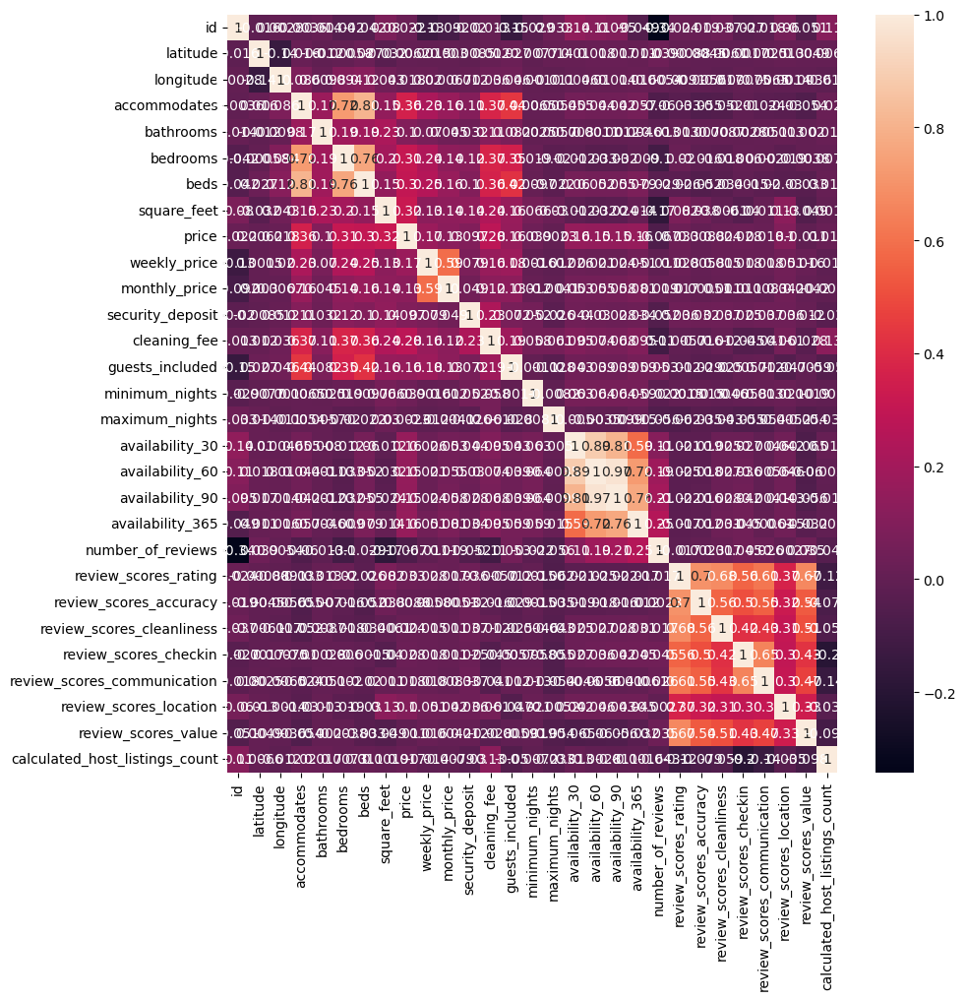

In [12]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr_listings_details = sns.heatmap(numeric_df_listings_details.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

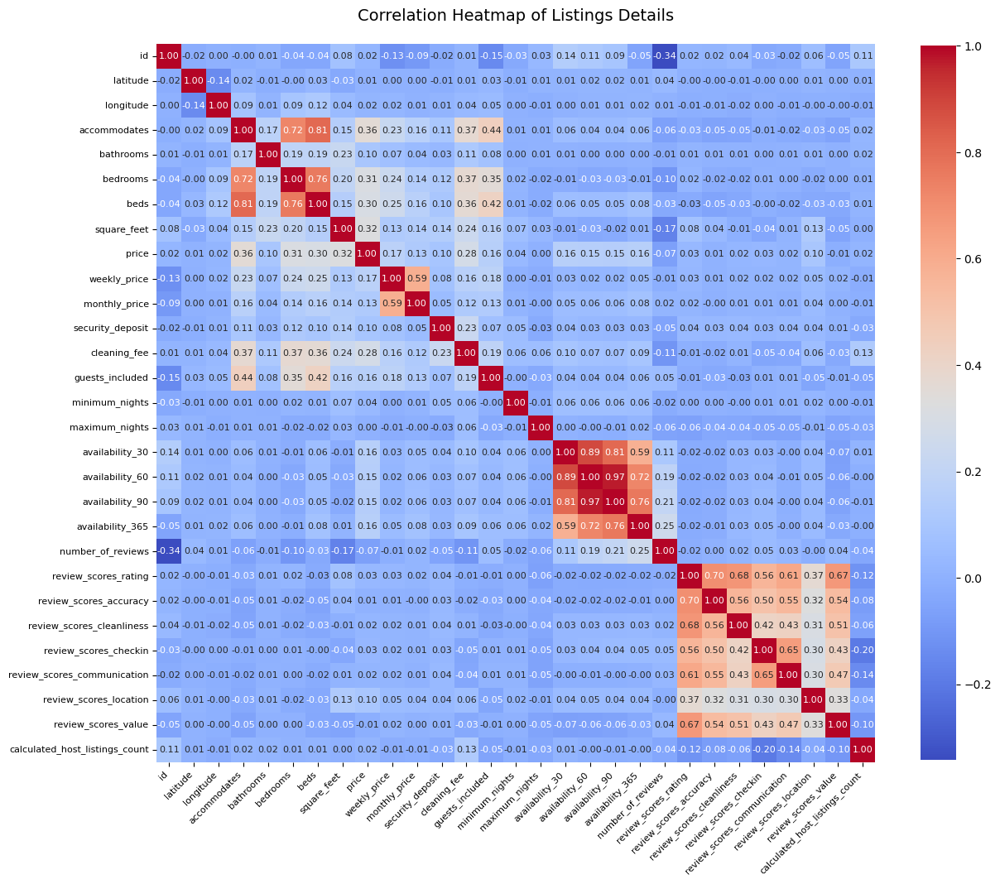

In [13]:
# Create a larger subplot
f, ax = plt.subplots(figsize=(14, 14))

# Customize heatmap
corr_listings_details = sns.heatmap(
    numeric_df_listings_details.corr(), 
    annot=True, 
    fmt=".2f",  # Limits decimals to 2 places
    cmap="coolwarm",  # Better color contrast for correlations
    square=True,  # Makes each cell square
    cbar_kws={"shrink": .8},  # Shrinks color bar
    annot_kws={"size": 8},  # Smaller text for annotations
    ax=ax
)

# Rotate labels
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)

# Set title
plt.title("Correlation Heatmap of Listings Details", fontsize=14, pad=20)

plt.savefig(path, bbox_inches='tight')

plt.show()

## Discussion about the heatmap

#### Correlation Analysis of Price with Other Variables

#### The variable price exhibits a strong positive correlation with the following variables:

#### Accommodates (0.31): Listings that can accommodate more people tend to have higher prices. This suggests that larger properties or those with more capacity generally command higher prices.

#### Beds (0.30): There is a similar relationship between the number of beds and price, indicating that properties with more beds are priced higher, likely due to their larger size or ability to host more guests.

#### Square Feet (0.32): The price is also positively correlated with square footage, suggesting that larger properties (in terms of living space) tend to have higher prices.

### However, review_score shows a weak or non-significant correlation with price. This implies that user review scores do not strongly influence the price of the listing. Although higher-rated listings may still be priced higher in some cases, the correlation suggests that price is not heavily determined by reviews.

# 4. Create a scatterplot (or plots) for the variables with the strongest correlations and examine the nature of their relationships.Discuss the output in a markdown cell.

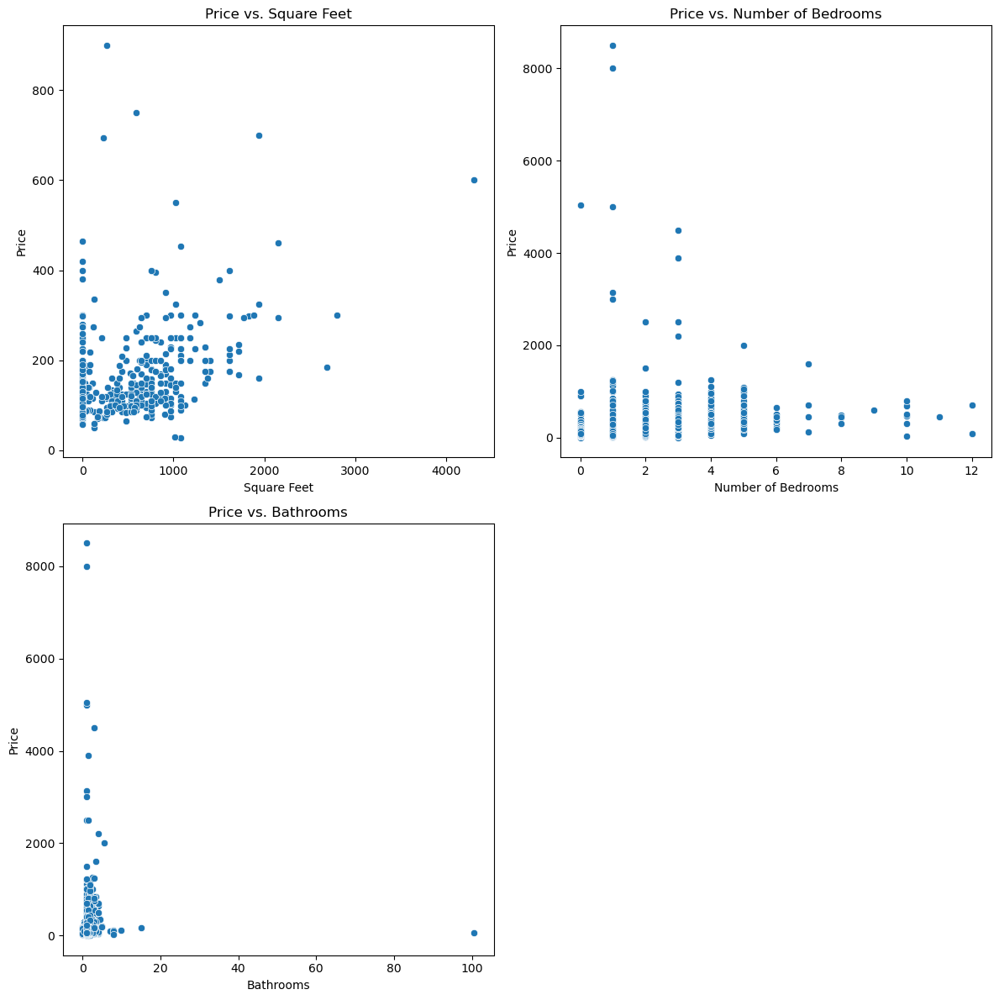

In [17]:
# Plot settings
plt.figure(figsize=(12, 12))

# 1. Scatter plot for Price vs Square Feet
plt.subplot(2, 2, 1)
sns.scatterplot(data=numeric_df_listings_details, x='square_feet', y='price')
plt.title("Price vs. Square Feet")
plt.xlabel("Square Feet")
plt.ylabel("Price")

# 2. Scatter plot for Price vs Number of Bedrooms
plt.subplot(2, 2, 2)
sns.scatterplot(data=numeric_df_listings_details, x='bedrooms', y='price')
plt.title("Price vs. Number of Bedrooms")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price")

# 3. Scatter plot for Price vs Bathrooms
plt.subplot(2, 2, 3)
sns.scatterplot(data=numeric_df_listings_details, x='bathrooms', y='price')
plt.title("Price vs. Bathrooms")
plt.xlabel("Bathrooms")
plt.ylabel("Price")


plt.tight_layout()
plt.show()




#### I had to change the bathrooms one because the 100 bathroom doesnt let me see the results clearly

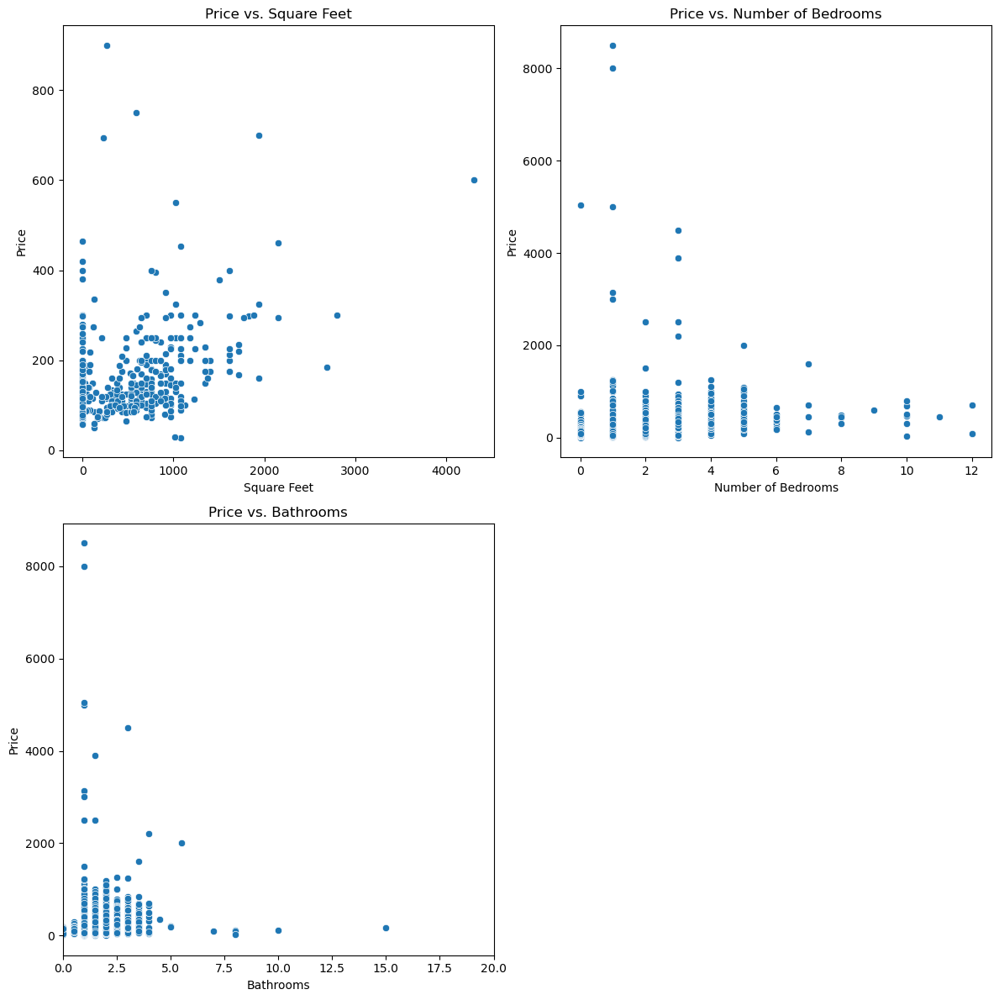

In [19]:
# Plot settings
plt.figure(figsize=(12, 12))

# 1. Scatter plot for Price vs Square Feet
plt.subplot(2, 2, 1)
sns.scatterplot(data=numeric_df_listings_details, x='square_feet', y='price')
plt.title("Price vs. Square Feet")
plt.xlabel("Square Feet")
plt.ylabel("Price")

# 2. Scatter plot for Price vs Number of Bedrooms
plt.subplot(2, 2, 2)
sns.scatterplot(data=numeric_df_listings_details, x='bedrooms', y='price')
plt.title("Price vs. Number of Bedrooms")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price")

# 3. Scatter plot for Price vs Bathrooms
plt.subplot(2, 2, 3)
sns.scatterplot(data=numeric_df_listings_details, x='bathrooms', y='price')
plt.title("Price vs. Bathrooms")
plt.xlabel("Bathrooms")
plt.ylabel("Price")

# Set the x-axis limit for bathrooms between 0 and 20
plt.xlim(0, 20)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()


#### In the Price vs. Square Feet scatter plot, the range between 500 and 1000 square feet shows a mix of prices, with some high values, suggesting that in this range, other factors (like location or amenities) might influence price as well. However, beyond 1000 square feet, we observe a clearer trend of higher prices. This is expected since larger properties generally offer more space, which can justify a higher price point, especially if they cater to larger groups or provide premium features. 

#### 
### That's an interesting insight! In the Price vs. Bedrooms scatter plot, it appears that properties with 1 to 3 bedrooms tend to have the highest prices, possibly due to demand for smaller but premium or centrally-located units, such as luxury apartments or vacation rentals in desirable areas.

### However, as the number of bedrooms increases beyond 3, the price does not continue to increase at the same rate, and we see fewer very high-priced listings. This could be due to:

#### Market Demand: Larger properties may be more commonly found in less expensive, residential areas where the price per square foot is lower.
### Target Audience: Listings with 4 or more bedrooms might cater to budget-conscious groups or families, rather than high-paying guests looking for upscale amenities in smaller units.
### Cost Efficiency: Properties with more bedrooms might optimize space but sacrifice luxury finishes, which keeps prices more moderate.
### This pattern suggests that, for this dataset, smaller properties with 1 to 3 bedrooms might be positioned as more premium, while larger properties ### cater to a different market segment with relatively lower price ceilings.

### And finally For Price vs. Bathrooms, properties with 1 to 3 bathrooms generally have the highest prices. Listings with more than 3 bathrooms tend to have lower prices, suggesting that premium properties often prioritize other luxury features over additional bathrooms.

# Create a pair plot of the entire data set.Comment on the distribution of the variables and mark variables you’d like to explore further with an explanation of why.

In [23]:
Pairplot1 = sns.pairplot(df_Listings_Details_Copy) 

C:\Users\toloz\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


##### Imposible to read I will choose the most important to my questions 

C:\Users\toloz\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\toloz\AppData\Local\Temp\ipykernel_32304\1406541710.py:34: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


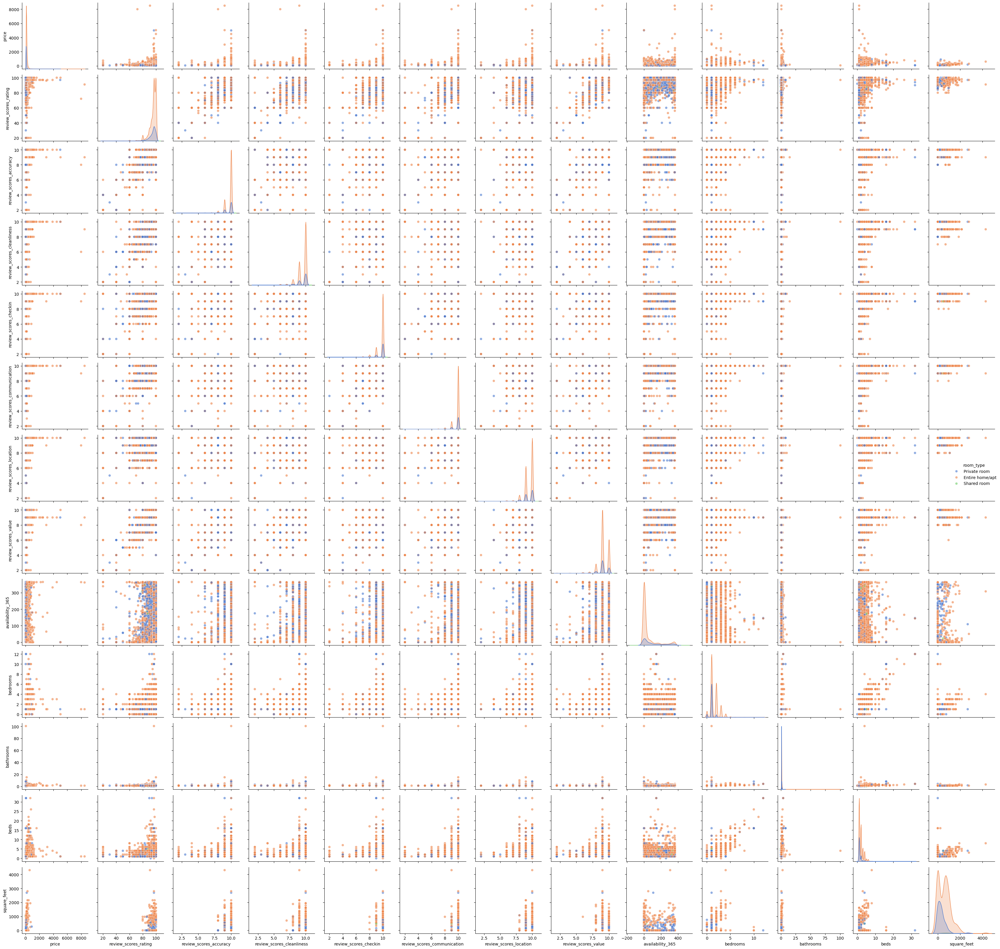

In [34]:
# Select relevant columns for the pair plot
columns_for_pairplot = [
    'price',                  # The target variable (Price)
    'neighbourhood',          # The neighborhood of the listing
    'review_scores_rating',   # Review score rating
    'review_scores_accuracy', # Accuracy score
    'review_scores_cleanliness',  # Cleanliness score
    'review_scores_checkin',  # Check-in score
    'review_scores_communication', # Communication score
    'review_scores_location',  # Location score
    'review_scores_value',    # Value score
    'room_type',              # Room type (e.g., Entire Home, Private Room)
    'availability_365',       # Availability across the year
    'bedrooms',               # Number of bedrooms
    'bathrooms',              # Number of bathrooms
    'beds',                   # Number of beds
    'square_feet'             # Size of the property
]

# Select the relevant data for pair plot
df_pairplot = df_Listings_Details_Copy[columns_for_pairplot]

# Optional: Limit the number of unique neighborhoods if there are too many
# For example, you could filter the neighborhoods to the top 10 most common ones
#df_pairplot = df_pairplot[df_Listings_Details_Copy['neighbourhood'].isin(df_Listings_Details_Copy['neighbourhood'].value_counts().index[:10])]

# Optional: Encode 'room_type' as a categorical variable (if necessary)
#df_pairplot['room_type'] = df_pairplot['room_type'].astype('category')

# Generate the pairplot
sns.pairplot(df_pairplot, hue='room_type', palette='muted', plot_kws={'alpha': 0.6})

# Show the plot
plt.tight_layout()
plt.show()


### From the distribution of review_scores_rating, we observe that it is right-skewed, with most listings receiving high ratings (close to 5.0). This suggests that the majority of Airbnb listings are well-rated, with relatively few listings receiving lower ratings.

### When looking at price, there appears to be a slight trend where listings with higher ratings tend to be priced higher. This could imply that higher-rated listings are often associated with better amenities, locations, or overall guest experience, which may justify a higher price.

### Further Exploration:To explore this relationship further, I will analyze how review_scores_rating correlates with price. This will help us understand whether listings with higher review scores tend to have higher prices or if the correlation is weaker.

<Axes: xlabel='review_scores_rating', ylabel='Count'>

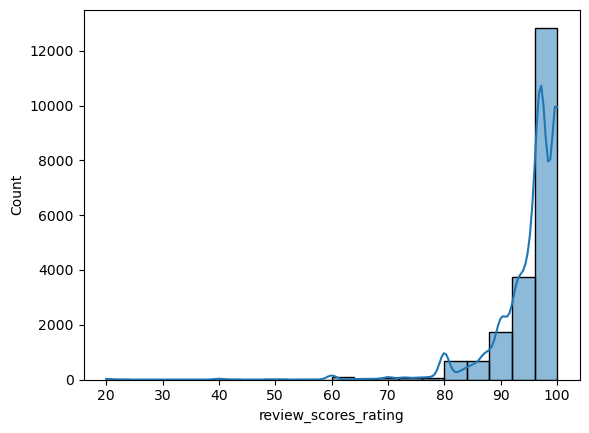

In [36]:
sns.histplot(df_Listings_Details_Copy['review_scores_rating'], bins = 20, kde = True)

In [38]:
df_Listings_Details_Copy.loc[df_Listings_Details_Copy['review_scores_rating'] < 34, 'Review score category'] = 'Low Rating'  

In [40]:
df_Listings_Details_Copy.loc[(df_Listings_Details_Copy['review_scores_rating'] >= 34) & (df_Listings_Details_Copy['review_scores_rating'] < 67), 'Review score category'] = 'Medium Rating' 

In [42]:
df_Listings_Details_Copy.loc[df_Listings_Details_Copy['review_scores_rating'] >= 67, 'Review score category'] = 'High Rating'

# Check the value counts to see the distribution of categories

In [44]:
df_Listings_Details_Copy['Review score category'].value_counts(dropna=False)

Review score category
High Rating      19896
Medium Rating      119
Low Rating          15
Name: count, dtype: int64

In [46]:
df_Listings_Details_Copy.columns

Index(['id', 'name', 'space', 'experiences_offered', 'neighborhood_overview',
       'access', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'city',
       'state', 'zipcode', 'smart_location', 'country_code', 'country',
       'latitude', 'longitude', 'is_location_exact', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price',
       'monthly_price', 'security_deposit', 'cleaning_fee', 'guests_included',
       'extra_people', 'minimum_nights', 'maximum_nights', 'calendar_updated',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'requires_license', 'license',
       'cancellation_policy'

C:\Users\toloz\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


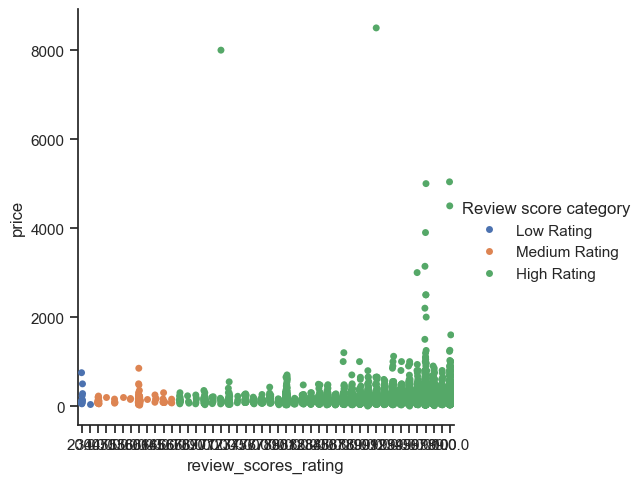

In [48]:
# Create a categorical plot in seaborn using the price categories created above

sns.set(style="ticks")
g2 = sns.catplot(x="review_scores_rating", y="price", hue="Review score category", data=df_Listings_Details_Copy)

C:\Users\toloz\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


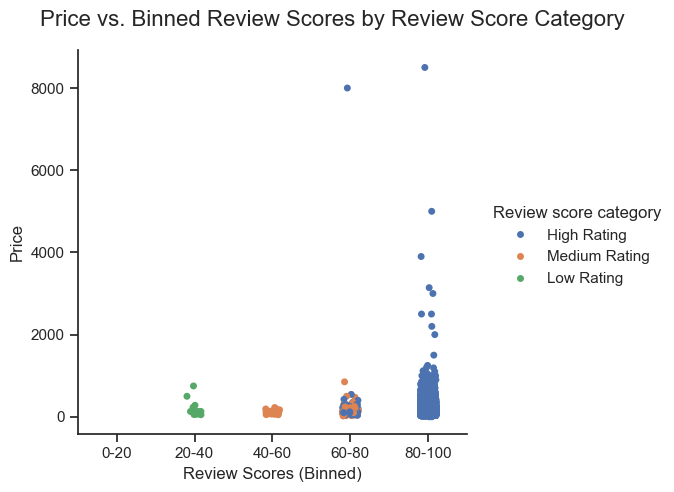

In [62]:
# Create bins for 'review_scores_rating' (binned in ranges of 20)
bins = [0, 20, 40, 60, 80, 100]  # Define the bin edges
labels = ['0-20', '20-40', '40-60', '60-80', '80-100']  # Define the labels for the bins

# Assign the binned labels to a new column 'review_score_bins'
df_Listings_Details_Copy['review_score_bins'] = pd.cut(df_Listings_Details_Copy['review_scores_rating'], bins=bins, labels=labels, right=False)

# Create the categorical plot with binned review scores
sns.set(style="ticks")
g2 = sns.catplot(x="review_score_bins", y="price", hue="Review score category", data=df_Listings_Details_Copy)

# Set axis labels and title
g2.set_axis_labels("Review Scores (Binned)", "Price")
g2.fig.suptitle("Price vs. Binned Review Scores by Review Score Category", size=16)

# Adjust layout and show plot
g2.tight_layout()
g2.fig.subplots_adjust(top=0.9)  # Adjust top space for title
plt.show()

g2.savefig("price_vs_binned_review_scores.svg")

# The analysis indicates that, in general:

- High-rated properties (80-100 range for review scores) tend to have higher prices.
- Most listings are concentrated in the highest rating categories, which reflects that guests prefer higher-rated properties.
- This supports the hypothesis that good reviews are associated with higher prices, likely due to increased demand and a perception of higher quality or better guest experiences.

## 1. How does the price vary by neighborhood in Amsterdam?
**Answer:**

*Pending further analysis.*

We need to investigate the price distribution across different neighborhoods in Amsterdam, potentially visualizing the neighborhood with boxplots or aggregating the data to see if there's a significant price difference based on location. This will be done after additional data exploration.

---

## 2. What factors influence the price of Airbnb listings?
**Answer:**

From our exploratory analysis and correlation study, the following factors have been identified as influencing the price of Airbnb listings:

- **Review Scores**: Listings with higher review scores, particularly the overall `review_scores_rating`, show a **strong positive correlation** with price. Higher ratings (80-100 range) are often associated with higher prices due to increased demand and higher perceived quality.

- **Property Size**:
  - **Number of Bedrooms, Bathrooms, and Beds**: More spacious properties with additional rooms (bedrooms, bathrooms, and beds) tend to have **higher prices**.
  - **Square Feet**: Larger properties, measured in square feet, also show a **positive correlation** with price, likely because they can accommodate more guests and provide more comfort.


---

## 3. What is the availability of Airbnb listings across different seasons?
**Answer:**

*Pending further analysis.*

We can analyze the `availability_365` column, which indicates the number of available days throughout the year. By examining this variable across different months or seasons (e.g., summer vs winter), we can see how listing availability varies. This question remains open for further investigation.

---

## 4. How do review scores correlate with pricing?
**Answer:**

We have identified that `review_scores_rating` correlates positively with price. Higher-rated listings (those with higher review scores in the 80-100 range) generally tend to have higher prices. This reflects that guests often associate higher ratings with better quality and service, which in turn increases the demand and price.

Additionally, review scores related to cleanliness, accuracy, communication, and other factors also tend to be higher for more expensive properties, further supporting this relationship.

---

## 5. What are the common cancellation policies, and how do they affect pricing?
**Answer:**

*Pending further analysis.*

We need to explore the `cancellation_policy` column, which includes different cancellation policy options (e.g., Flexible, Moderate, Strict). By analyzing how these policies impact pricing, we can assess whether more flexible policies are associated with higher or lower prices. This will require further investigation.

---

## 6. What is the distribution of room types across different price ranges?
**Answer:**

*Pending further analysis.*

At this point, we haven't fully explored the distribution of room types across different price ranges. We will need to investigate the relationship between `room_type` (e.g., Entire Home, Private Room) and `price`. This can be done by visualizing the data with a boxplot or barplot, which will help us understand how the prices vary by room type.

We hypothesize that larger listings, such as **Entire Homes**, will be priced higher compared to **Private Rooms**, which tend to be more affordable. This will be explored further with visualizations and statistical analysis.

---

## 7. How do specific amenities impact the price of listings?
**Answer:**

*Pending further analysis.*

We can explore how the presence or absence of specific amenities (e.g., Wi-Fi, Kitchen, Pool, Parking) influences the price. By analyzing the `amenities` column and its impact on price, we can assess if certain amenities (such as pools, hot tubs, or air conditioning) correlate with higher prices. Further exploration of this will be conducted.



# Hypotheses

## The neighborhood (location) significantly affects the price of Airbnb listings

## Larger properties (e.g., more bedrooms and bathrooms) will have higher prices.

## Room type (e.g., Entire Home, Private Room) significantly affects the price.

## The presence of amenities like Wi-Fi, parking, and air conditioning affects the price of listings.